In [1]:
# Make sure you are using the cmpi6-2019.10 kernel


# Add ldcpy root to system path (MODIFY FOR YOUR LDCPY CODE LOCATION)
import sys

sys.path.insert(0, '/glade/u/home/abaker/repos/ldcpy')
import ldcpy

# Display output of plots directly in Notebook
%matplotlib inline
# Automatically reload module if it is editted
%reload_ext autoreload
%autoreload 2

# silence warnings
import warnings

warnings.filterwarnings("ignore")

Start DASK...and connect to client

In [2]:
from dask.distributed import Client
from ncar_jobqueue import NCARCluster

cluster = NCARCluster(project='NTDD0004')
# scale as needed
cluster.adapt(minimum_jobs=1, maximum_jobs=30)
cluster
client = Client(cluster)

In [3]:
# list  directory contents
import os

os.listdir("/glade/work/abaker/zfp-stuff")

['091', '092', 'orig', 'orig_d5']

In [4]:
# List the original data files
os.listdir("/glade/work/abaker/zfp-stuff/orig")

['b.e11.BRCP85C5CNBDRD.f09_g16.031.cam.h0.CCN3.200601-201012.nc',
 'b.e11.BRCP85C5CNBDRD.f09_g16.031.cam.h0.U.200601-201012.nc',
 'b.e11.BRCP85C5CNBDRD.f09_g16.031.cam.h0.LHFLX.200601-201012.nc',
 'b.e11.BRCP85C5CNBDRD.f09_g16.031.cam.h0.TS.200601-201012.nc']

In [5]:
os.listdir("/glade/work/abaker/zfp-stuff/091")

['zfp_p_18', 'zfp_a_0.01', 'zfp_p_16', 'zfp_p_20', 'zfp_p_12']

In [7]:
col_ccn3 = ldcpy.open_datasets(
    "cam-fv",
    ["CCN3"],
    [
        "/glade/work/abaker/zfp-stuff/orig/b.e11.BRCP85C5CNBDRD.f09_g16.031.cam.h0.CCN3.200601-201012.nc",
        "/glade/work/abaker/zfp-stuff/091/zfp_p_16/b.e11.BRCP85C5CNBDRD.f09_g16.031.cam.h0.CCN3.200601-201012.nc",
        "/glade/work/abaker/zfp-stuff/092/zfp_p_16/b.e11.BRCP85C5CNBDRD.f09_g16.031.cam.h0.CCN3.200601-201012.nc",
        "/glade/work/abaker/zfp-stuff/091/zfp_p_18/b.e11.BRCP85C5CNBDRD.f09_g16.031.cam.h0.CCN3.200601-201012.nc",
        "/glade/work/abaker/zfp-stuff/092/zfp_p_14/b.e11.BRCP85C5CNBDRD.f09_g16.031.cam.h0.CCN3.200601-201012.nc",
    ],
    ["orig", "091_p16", "092_p16", "091_p18", "092_p14"],
    chunks={"time": 700},
)
col_ccn3

dataset size in GB 1.99



<xarray.Dataset>
Dimensions:     (collection: 5, time: 60, lev: 30, lat: 192, lon: 288)
Coordinates:
  * lat         (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
  * lev         (lev) float64 3.643 7.595 14.36 24.61 ... 957.5 976.3 992.6
  * lon         (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * time        (time) object 2006-02-01 00:00:00 ... 2011-01-01 00:00:00
    cell_area   (lat, collection, lon) float64 dask.array<chunksize=(192, 1, 288), meta=np.ndarray>
  * collection  (collection) <U7 'orig' '091_p16' '092_p16' '091_p18' '092_p14'
Data variables:
    CCN3        (collection, time, lev, lat, lon) float32 dask.array<chunksize=(1, 60, 30, 192, 288), meta=np.ndarray>
Attributes: (12/15)
    Conventions:      CF-1.0
    source:           CAM
    case:             b.e11.BRCP85C5CNBDRD.f09_g16.031
    title:            UNSET
    logname:          mickelso
    host:             ys1023
    ...               ...
    topography_file:  /glade/p/cesmdata/cseg/inputdata/atm/cam/topo/USGS-gtop...
    history:          Mon May 10 15:29:57 2021: ncks -d time,0,59,1 b.e11.BRC...
    NCO:              netCDF Operators version 4.9.5 (Homepage = http://nco.s...
    cell_measures:    area: cell_area
    data_type:        cam-fv
    file_size:        [2.72506698e+08 1.67881873e+08 2.16870361e+08 1.8460477...

In [8]:
col_u = ldcpy.open_datasets(
    "cam-fv",
    ["U"],
    [
        "/glade/work/abaker/zfp-stuff/orig/b.e11.BRCP85C5CNBDRD.f09_g16.031.cam.h0.U.200601-201012.nc",
        "/glade/work/abaker/zfp-stuff/091/zfp_p_12/b.e11.BRCP85C5CNBDRD.f09_g16.031.cam.h0.U.200601-201012.nc",
        "/glade/work/abaker/zfp-stuff/092/zfp_p_12/b.e11.BRCP85C5CNBDRD.f09_g16.031.cam.h0.U.200601-201012.nc",
        "/glade/work/abaker/zfp-stuff/091/zfp_p_20/b.e11.BRCP85C5CNBDRD.f09_g16.031.cam.h0.U.200601-201012.nc",
        "/glade/work/abaker/zfp-stuff/092/zfp_p_16/b.e11.BRCP85C5CNBDRD.f09_g16.031.cam.h0.U.200601-201012.nc",
    ],
    ["orig", "091_p12", "092_p12", "091_p20", "092_p16"],
    chunks={"time": 700},
)
col_u

dataset size in GB 1.99



<xarray.Dataset>
Dimensions:     (collection: 5, time: 60, lev: 30, lat: 192, lon: 288)
Coordinates:
  * lat         (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
  * lev         (lev) float64 3.643 7.595 14.36 24.61 ... 957.5 976.3 992.6
  * lon         (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * time        (time) object 2006-02-01 00:00:00 ... 2011-01-01 00:00:00
    cell_area   (lat, collection, lon) float64 dask.array<chunksize=(192, 1, 288), meta=np.ndarray>
  * collection  (collection) <U7 'orig' '091_p12' '092_p12' '091_p20' '092_p16'
Data variables:
    U           (collection, time, lev, lat, lon) float32 dask.array<chunksize=(1, 60, 30, 192, 288), meta=np.ndarray>
Attributes: (12/15)
    Conventions:      CF-1.0
    source:           CAM
    case:             b.e11.BRCP85C5CNBDRD.f09_g16.031
    title:            UNSET
    logname:          mickelso
    host:             ys1023
    ...               ...
    topography_file:  /glade/p/cesmdata/cseg/inputdata/atm/cam/topo/USGS-gtop...
    history:          Mon May 10 15:28:47 2021: ncks -d time,0,59,1 b.e11.BRC...
    NCO:              netCDF Operators version 4.9.5 (Homepage = http://nco.s...
    cell_measures:    area: cell_area
    data_type:        cam-fv
    file_size:        [2.87271956e+08 1.19508143e+08 1.57794733e+08 2.2145823...

In [9]:
col_lhflx = ldcpy.open_datasets(
    "cam-fv",
    ["LHFLX"],
    [
        "/glade/work/abaker/zfp-stuff/orig/b.e11.BRCP85C5CNBDRD.f09_g16.031.cam.h0.LHFLX.200601-201012.nc",
        "/glade/work/abaker/zfp-stuff/091/zfp_p_16/b.e11.BRCP85C5CNBDRD.f09_g16.031.cam.h0.LHFLX.200601-201012.nc",
        "/glade/work/abaker/zfp-stuff/092/zfp_p_16/b.e11.BRCP85C5CNBDRD.f09_g16.031.cam.h0.LHFLX.200601-201012.nc",
        "/glade/work/abaker/zfp-stuff/091/zfp_p_18/b.e11.BRCP85C5CNBDRD.f09_g16.031.cam.h0.LHFLX.200601-201012.nc",
        "/glade/work/abaker/zfp-stuff/092/zfp_p_14/b.e11.BRCP85C5CNBDRD.f09_g16.031.cam.h0.LHFLX.200601-201012.nc",
    ],
    [
        "orig",
        "091_p16",
        "092_p16",
        "091_p18",
        "092_p14",
    ],
    chunks={"time": 700},
)
col_lhflx

dataset size in GB 0.07



<xarray.Dataset>
Dimensions:     (collection: 5, time: 60, lat: 192, lon: 288)
Coordinates:
  * lat         (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
  * lon         (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * time        (time) object 2006-02-01 00:00:00 ... 2011-01-01 00:00:00
    cell_area   (lat, collection, lon) float64 dask.array<chunksize=(192, 1, 288), meta=np.ndarray>
  * collection  (collection) <U7 'orig' '091_p16' '092_p16' '091_p18' '092_p14'
Data variables:
    LHFLX       (collection, time, lat, lon) float32 dask.array<chunksize=(1, 60, 192, 288), meta=np.ndarray>
Attributes: (12/15)
    Conventions:      CF-1.0
    source:           CAM
    case:             b.e11.BRCP85C5CNBDRD.f09_g16.031
    title:            UNSET
    logname:          mickelso
    host:             ys1023
    ...               ...
    topography_file:  /glade/p/cesmdata/cseg/inputdata/atm/cam/topo/USGS-gtop...
    history:          Thu May 20 11:06:14 2021: ncks -d time,0,59,1 b.e11.BRC...
    NCO:              netCDF Operators version 4.9.5 (Homepage = http://nco.s...
    cell_measures:    area: cell_area
    data_type:        cam-fv
    file_size:        [10456229.  6947381.  8064521.  7612994.  7375537.]

In [10]:
col_ts = ldcpy.open_datasets(
    "cam-fv",
    ["TS"],
    [
        "/glade/work/abaker/zfp-stuff/orig/b.e11.BRCP85C5CNBDRD.f09_g16.031.cam.h0.TS.200601-201012.nc",
        "/glade/work/abaker/zfp-stuff/091/zfp_p_12/b.e11.BRCP85C5CNBDRD.f09_g16.031.cam.h0.TS.200601-201012.nc",
        "/glade/work/abaker/zfp-stuff/092/zfp_p_12/b.e11.BRCP85C5CNBDRD.f09_g16.031.cam.h0.TS.200601-201012.nc",
        "/glade/work/abaker/zfp-stuff/091/zfp_p_16/b.e11.BRCP85C5CNBDRD.f09_g16.031.cam.h0.TS.200601-201012.nc",
        "/glade/work/abaker/zfp-stuff/092/zfp_p_14/b.e11.BRCP85C5CNBDRD.f09_g16.031.cam.h0.TS.200601-201012.nc",
    ],
    [
        "orig",
        "091_p12",
        "092_p12",
        "091_p16",
        "092_p14",
    ],
    chunks={"time": 700},
)
col_ts

dataset size in GB 0.07



<xarray.Dataset>
Dimensions:     (collection: 5, time: 60, lat: 192, lon: 288)
Coordinates:
  * lat         (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
  * lon         (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * time        (time) object 2006-02-01 00:00:00 ... 2011-01-01 00:00:00
    cell_area   (lat, collection, lon) float64 dask.array<chunksize=(192, 1, 288), meta=np.ndarray>
  * collection  (collection) <U7 'orig' '091_p12' '092_p12' '091_p16' '092_p14'
Data variables:
    TS          (collection, time, lat, lon) float32 dask.array<chunksize=(1, 60, 192, 288), meta=np.ndarray>
Attributes: (12/15)
    Conventions:      CF-1.0
    source:           CAM
    case:             b.e11.BRCP85C5CNBDRD.f09_g16.031
    title:            UNSET
    logname:          mickelso
    host:             ys1023
    ...               ...
    topography_file:  /glade/p/cesmdata/cseg/inputdata/atm/cam/topo/USGS-gtop...
    history:          Mon May 10 15:27:00 2021: ncks -d time,0,59,1 b.e11.BRC...
    NCO:              netCDF Operators version 4.9.5 (Homepage = http://nco.s...
    cell_measures:    area: cell_area
    data_type:        cam-fv
    file_size:        [7697245. 1665148. 2317105. 3603384. 3591264.]

In [26]:
ldcpy.compare_stats(
    col_ccn3.isel(time=10, lev=0), "CCN3", ["orig", "091_p16", "092_p16", "091_p18", "092_p14"]
)

,orig,091_p16,092_p16,091_p18,092_p14
mean,0.0010426,0.0010426,0.0010429,0.0010426,0.0010446
variance,3.6717e-07,3.6717e-07,3.6799e-07,3.6717e-07,3.7644e-07
standard deviation,0.00060595,0.00060595,0.00060662,0.00060595,0.00061355
min value,7.9426e-06,7.9423e-06,-1.3351e-05,7.9426e-06,-6.8665e-05
max value,0.002984,0.0029839,0.0030953,0.0029839,0.0034485
probability positive,1,1,0.99899,1,0.98794
number of zeros,0,0,3,0,17
spatial autocorr - latitude,0.99618,0.99618,0.9941,0.99618,0.97623
spatial autocorr - longitude,0.99997,0.99997,0.99831,0.99997,0.98734
entropy estimate,0.45886,0.29985,0.29402,0.35019,0.24643


,091_p16,092_p16,091_p18,092_p14
max abs diff,3.872e-07,0.00026242,1.0501e-07,0.0010851
min abs diff,0,9.8953e-10,0,6.4028e-10
mean abs diff,4.2784e-08,2.3421e-05,1.0755e-08,7.6283e-05
mean squared diff,8.2308e-20,7.364e-14,2.9938e-22,3.8778e-12
root mean squared diff,6.4755e-08,3.5495e-05,1.6248e-08,0.00011592
normalized root mean squared diff,1.8189e-05,0.0098361,4.5744e-06,0.032177
normalized max pointwise error,0.0001301,0.088178,3.3876e-05,0.31517
pearson correlation coefficient,1,0.99884,1,0.98775
ks p-value,0.43541,0.00026716,0.43983,2.8127e-68
spatial relative error(% > 0.0001),4.333,99.528,0,99.841


In [29]:
# 3D so just do lev 0 or it is really slow
ldcpy.compare_stats(
    col_u.isel(time=10, lev=0), "U", ["orig", "091_p12", "092_p12", "091_p20", "092_p16"]
)

,orig,091_p12,092_p12,091_p20,092_p16
mean,4.2841,4.2841,4.2876,4.2841,4.2844
variance,831.7,831.7,831.85,831.7,831.71
standard deviation,28.839,28.839,28.842,28.839,28.839
min value,-45.351,-45.406,-45.969,-45.351,-45.375
max value,77.816,77.812,78.641,77.817,77.839
probability positive,0.59932,0.59932,0.59948,0.59932,0.59937
number of zeros,0,0,1,0,1
spatial autocorr - latitude,0.99723,0.99723,0.99721,0.99723,0.99723
spatial autocorr - longitude,0.99994,0.99994,0.99992,0.99994,0.99994
entropy estimate,0.48705,0.19968,0.24327,0.40171,0.3818


,091_p12,092_p12,091_p20,092_p16
max abs diff,0.15022,1.3953,0.00078583,0.14727
min abs diff,0,3.8147e-06,0,0
mean abs diff,0.011697,0.12223,5.7751e-05,0.010915
mean squared diff,4.3759e-12,1.258e-05,2.6205e-13,9.7139e-08
root mean squared diff,0.017415,0.16783,8.682e-05,0.01496
normalized root mean squared diff,0.00016355,0.0014896,8.1976e-07,0.00013219
normalized max pointwise error,0.0011439,0.0090092,6.3182e-06,0.0009792
pearson correlation coefficient,1,0.99998,1,1
ks p-value,1,1,1,1
spatial relative error(% > 0.0001),88.527,98.712,0.02351,85.382


In [30]:
ldcpy.compare_stats(
    col_lhflx.isel(time=10), "LHFLX", ["orig", "091_p16", "092_p16", "091_p18", "092_p14"]
)

,orig,091_p16,092_p16,091_p18,092_p14
mean,86.72,86.72,86.721,86.72,86.722
variance,4010.6,4010.6,4010.6,4010.6,4010.8
standard deviation,63.33,63.33,63.33,63.33,63.331
min value,-3.8508,-3.8535,-3.8384,-3.8506,-3.75
max value,447.16,447.21,447.15,447.16,447.47
probability positive,0.82709,0.82709,0.82706,0.82709,0.82702
number of zeros,0,0,0,0,0
spatial autocorr - latitude,0.9784,0.9784,0.9784,0.9784,0.9784
spatial autocorr - longitude,0.9813,0.9813,0.9813,0.9813,0.9813
entropy estimate,0.51122,0.36734,0.42126,0.405,0.38416


,091_p16,092_p16,091_p18,092_p14
max abs diff,0.05011,0.21808,0.013245,0.91273
min abs diff,0,0,0,0
mean abs diff,0.00395,0.020434,0.0009836,0.081825
mean squared diff,5.3092e-11,3.8838e-07,1.1373e-11,4.5352e-06
root mean squared diff,0.0059725,0.02941,0.0014945,0.11788
normalized root mean squared diff,1.1229e-05,5.567e-05,2.8136e-06,0.00022304
normalized max pointwise error,8.6678e-05,0.00048353,2.9366e-05,0.0020237
pearson correlation coefficient,1,1,1,1
ks p-value,1,1,1,1
spatial relative error(% > 0.0001),11.661,78.554,1.2171,94.434


In [31]:
ldcpy.compare_stats(
    col_ts.isel(time=10), "TS", ["orig", "091_p12", "092_p12", "091_p16", "092_p14"]
)

,orig,091_p12,092_p12,091_p16,092_p14
mean,286.58,286.58,286.63,286.58,286.58
variance,501.42,501.52,502.6,501.42,501.46
standard deviation,22.392,22.395,22.419,22.392,22.393
min value,224.47,224.44,224.45,224.46,224.42
max value,310.34,309.88,310.78,310.33,310.62
probability positive,1,1,1,1,1
number of zeros,0,0,0,0,0
spatial autocorr - latitude,0.99554,0.99547,0.99529,0.99554,0.99549
spatial autocorr - longitude,0.99824,0.99818,0.99803,0.99824,0.99819
entropy estimate,0.4065,0.079737,0.11391,0.22836,0.21945


,091_p12,092_p12,091_p16,092_p14
max abs diff,0.87418,3.8325,0.054474,1.0541
min abs diff,0,0,0,0
mean abs diff,0.17707,0.41642,0.013445,0.14391
mean squared diff,9.8921e-06,0.0029003,4.8251e-09,1.7292e-05
root mean squared diff,0.2226,0.56962,0.016758,0.19257
normalized root mean squared diff,0.0024438,0.0067136,0.00018335,0.0022644
normalized max pointwise error,0.0099894,0.044631,0.00063438,0.012032
pearson correlation coefficient,0.99996,0.99967,1,0.99996
ks p-value,0.0049227,0.0072675,1,0.99997
spatial relative error(% > 0.0001),89.589,95.083,7.8487,86.243


In [10]:
lhflx_o = col_lhflx["LHFLX"].isel(time=0).sel(collection='orig').data.compute()
print(lhflx_o.shape)
print(lhflx_o.flags)
print(lhflx_o.strides)

(192, 288)
  C_CONTIGUOUS : True
  F_CONTIGUOUS : False
  OWNDATA : False
  WRITEABLE : True
  ALIGNED : False
  WRITEBACKIFCOPY : False
  UPDATEIFCOPY : False

(1152, 4)


In [11]:
# so confirm this is stored row-wise.....
1152 / 4

288.0

In [12]:
ts_091_p12 = col_ts["TS"].isel(time=0).sel(collection='091_p12').data.compute()
print(ts_091_p12.shape)
print(ts_091_p12.flags)
print(ts_091_p12.strides)
print(ts_091_p12.ndim)

(192, 288)
  C_CONTIGUOUS : True
  F_CONTIGUOUS : False
  OWNDATA : False
  WRITEABLE : True
  ALIGNED : False
  WRITEBACKIFCOPY : False
  UPDATEIFCOPY : False

(1152, 4)
2


In [17]:
ts_orig = col_ts["TS"].sel(collection='orig').data.compute()
print(f"type(ts_orig): {type(ts_orig)}")
print(f"ts_orig.dtype: {ts_orig.dtype}")
print(f"number of elements: {ts_orig.size}")
print((f"ts_orig.nbytes: {ts_orig.nbytes}B or %.2fMB") % (ts_orig.nbytes / 1024 / 1024))
print(f"ts_orig.shape: {ts_orig.shape}")
print(f"ts_orig.strides: {ts_orig.strides}")
# print(ts_orig.flags)

type(ts_orig): <class 'numpy.ndarray'>
ts_orig.dtype: float32
number of elements: 3317760
ts_orig.nbytes: 13271040B or 12.66MB
ts_orig.shape: (60, 192, 288)
ts_orig.strides: (221184, 1152, 4)


In [18]:
# lossless
import gzip

ts_ll = gzip.compress(ts_orig)
print(f"type(ts_ll): {type(ts_ll)}")
print((f"number of bytes: {len(ts_ll)} (%.2fMB)") % (len(ts_ll) / 1024 / 1024))
print("compression ratio(orig): %0.2f\n" % (ts_orig.nbytes / len(ts_ll)))

type(ts_ll): <class 'bytes'>
number of bytes: 10060900 (9.59MB)
compression ratio(orig): 1.32



In [19]:
# lossy
import zfpy

ts_compressed = zfpy.compress_numpy(ts_orig, precision=20)
print(f"type(ts_compressed): {type(ts_compressed)}")
print((f"number of bytes: {len(ts_compressed)} (%.2fMB)") % (len(ts_compressed) / 1024 / 1024))

print("compression ratio (vs. orig): %0.2f" % (ts_orig.nbytes / len(ts_compressed)))
print("compression ratio(vs. lossless) : %0.2f\n" % (len(ts_ll) / len(ts_compressed)))


# get reconstructed version
ts_decompressed = zfpy.decompress_numpy(ts_compressed)
print(f"type(ts_decompressed): {type(ts_decompressed)}")
print(
    (f"ts_decompressed.nbytes: {ts_decompressed.nbytes}B or %.2fMB")
    % (ts_decompressed.nbytes / 1024 / 1024)
)
print(f"min difference: {(ts_decompressed- ts_orig).min()}")
print(f"max difference: {(ts_decompressed- ts_orig).max()}")

type(ts_compressed): <class 'bytes'>
number of bytes: 3033768 (2.89MB)
compression ratio (vs. orig): 4.37
compression ratio(vs. lossless) : 3.32

type(ts_decompressed): <class 'numpy.ndarray'>
ts_decompressed.nbytes: 13271040B or 12.66MB
min difference: -0.0232391357421875
max difference: 0.032440185546875


In [22]:
# compare data arrays
import xarray as xr

TS_orig = col_ts["TS"].sel(collection='orig')
TS_zfp = TS_orig.copy()
TS_zfp.data = ts_decompressed

TS_orig_ds = TS_orig.to_dataset()
TS_zfp_ds = TS_zfp.to_dataset()

In [24]:
new_col_ts = ldcpy.collect_datasets("cam-fv", ["TS"], [TS_orig_ds, TS_zfp_ds], ["orig", "zfp"])

KeyError: 'gw'

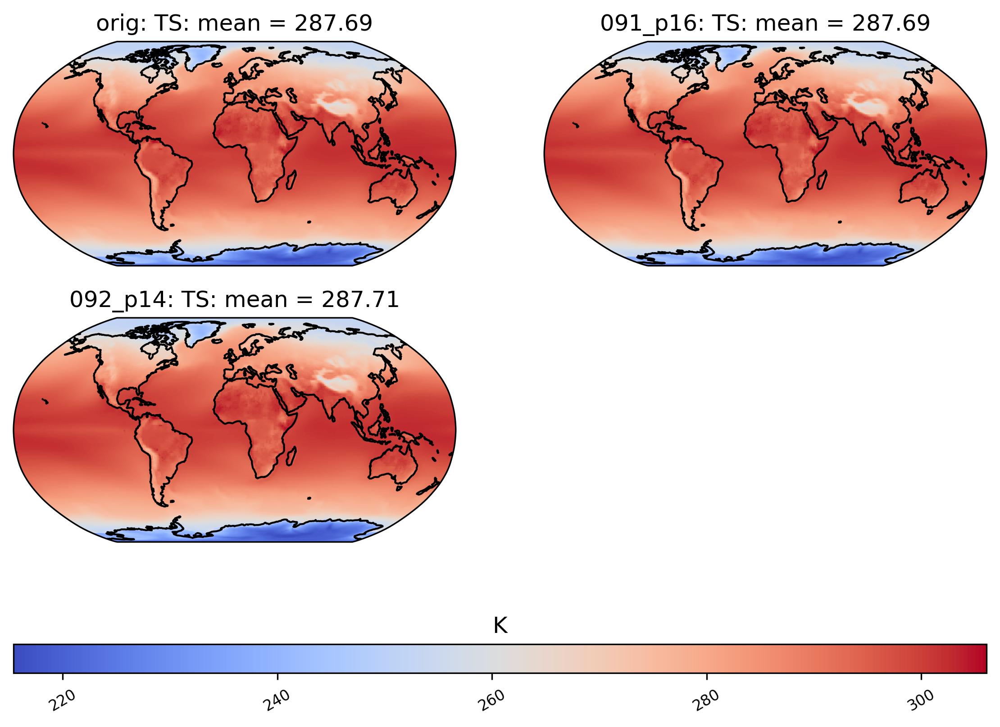

In [21]:
# look at mean values
ldcpy.plot(col_ts, "TS", sets=["orig", "091_p16", "092_p14"], calc="mean")

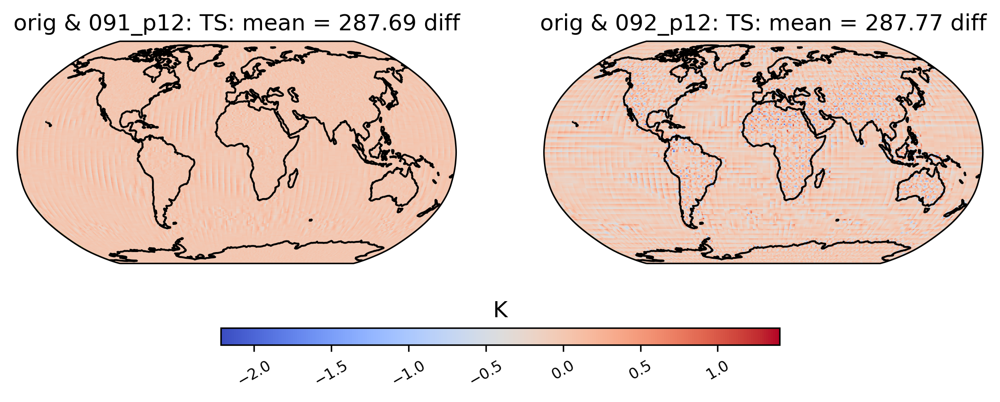

In [30]:
# diff between mean
ldcpy.plot(
    col_ts,
    "TS",
    sets=["orig", "091_p12", "092_p12"],
    calc="mean",
    calc_type="diff",
)

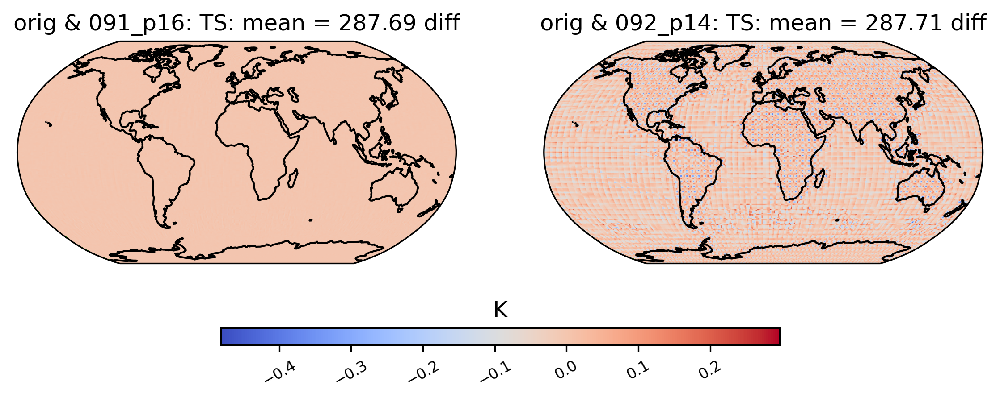

In [26]:
# diff between mean
ldcpy.plot(
    col_ts,
    "TS",
    sets=["orig", "091_p16", "092_p14"],
    calc="mean",
    calc_type="diff",
)

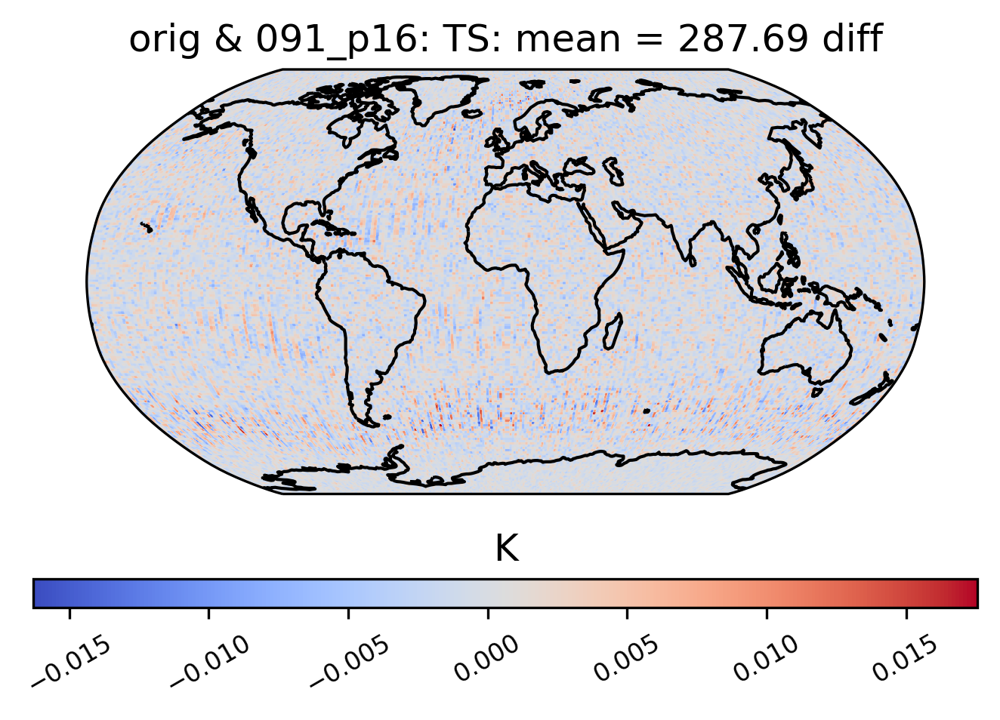

In [28]:
# diff between mean
ldcpy.plot(
    col_ts,
    "TS",
    sets=["orig", "091_p16"],
    calc="mean",
    calc_type="diff",
)

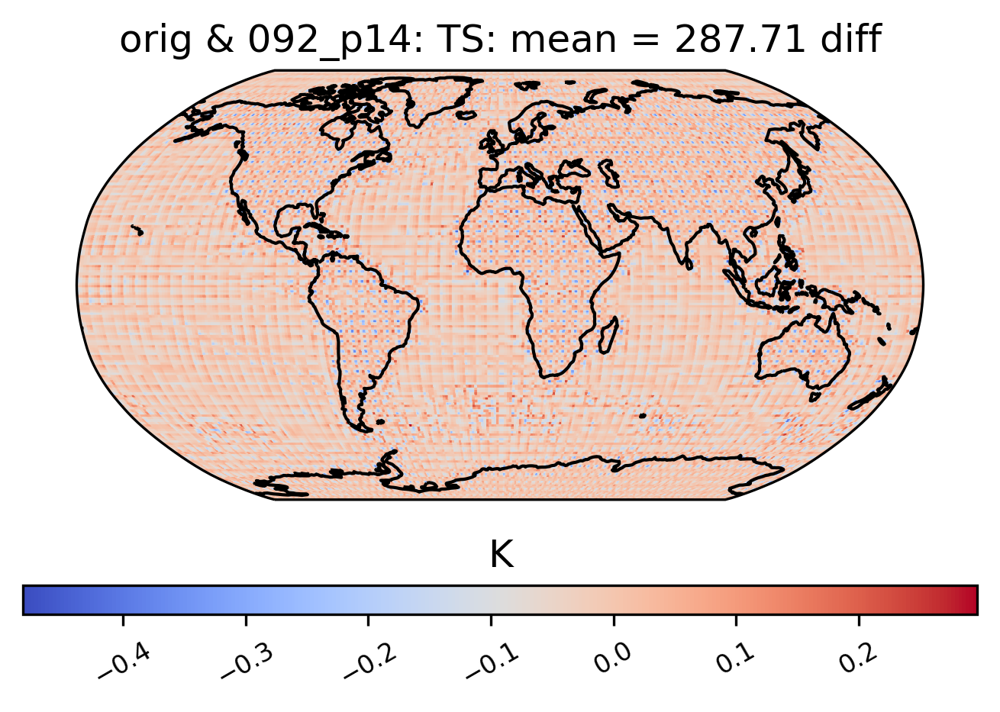

In [27]:
# diff between mean
ldcpy.plot(
    col_ts,
    "TS",
    sets=["orig", "092_p14"],
    calc="mean",
    calc_type="diff",
)

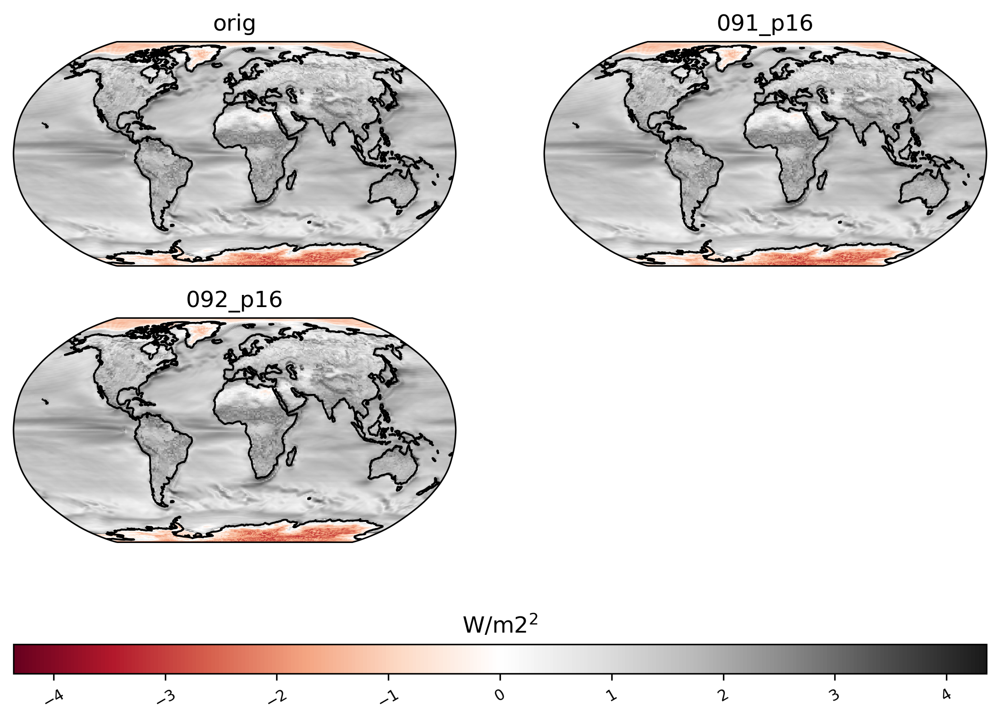

In [29]:
# Let's look and compare the north south contrast variances
ldcpy.plot(
    col_lhflx,
    "LHFLX",
    sets=["orig", "091_p16", "092_p16"],
    calc="ns_con_var",
    color="RdGy",
    calc_type="raw",
    transform="log",
    axes_symmetric=True,
    short_title=True,
)

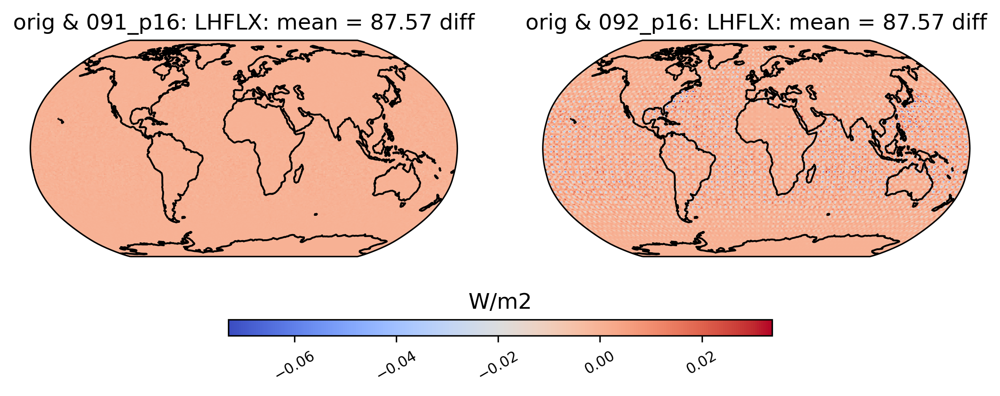

In [31]:
# diff between mean LHFLX values across the entire timeseries
ldcpy.plot(
    col_lhflx, "LHFLX", sets=["orig", "091_p16", "092_p16"], calc="mean", calc_type="diff", lev=0
)

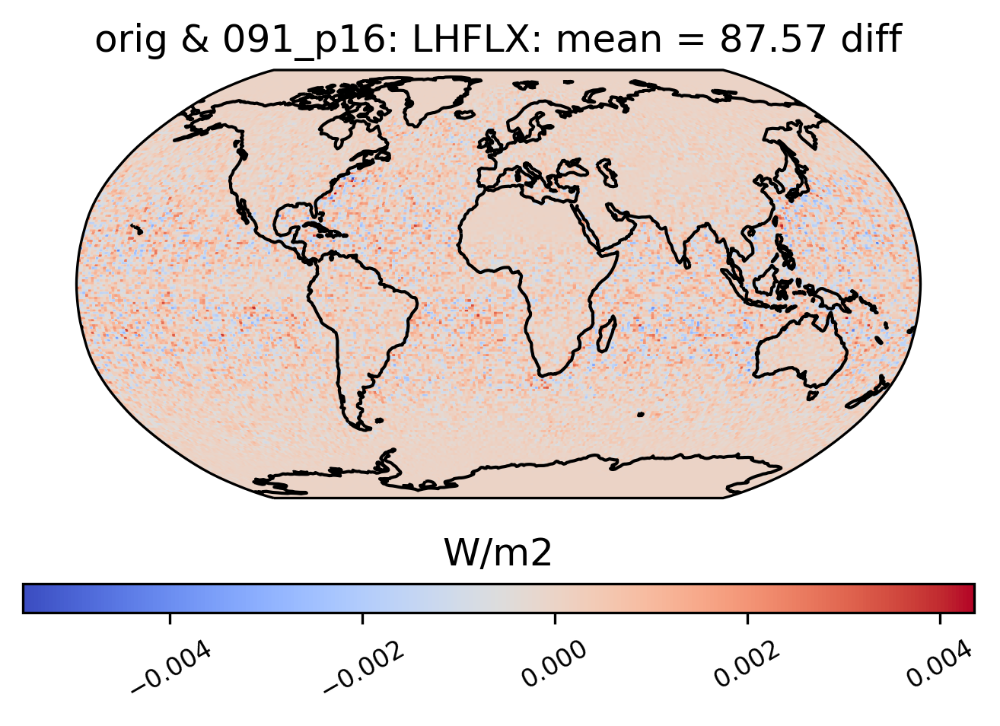

In [32]:
# diff between mean LHFLX values across the entire timeseries
# just one so we can zoom in more
ldcpy.plot(col_lhflx, "LHFLX", sets=["orig", "091_p16"], calc="mean", calc_type="diff", lev=0)

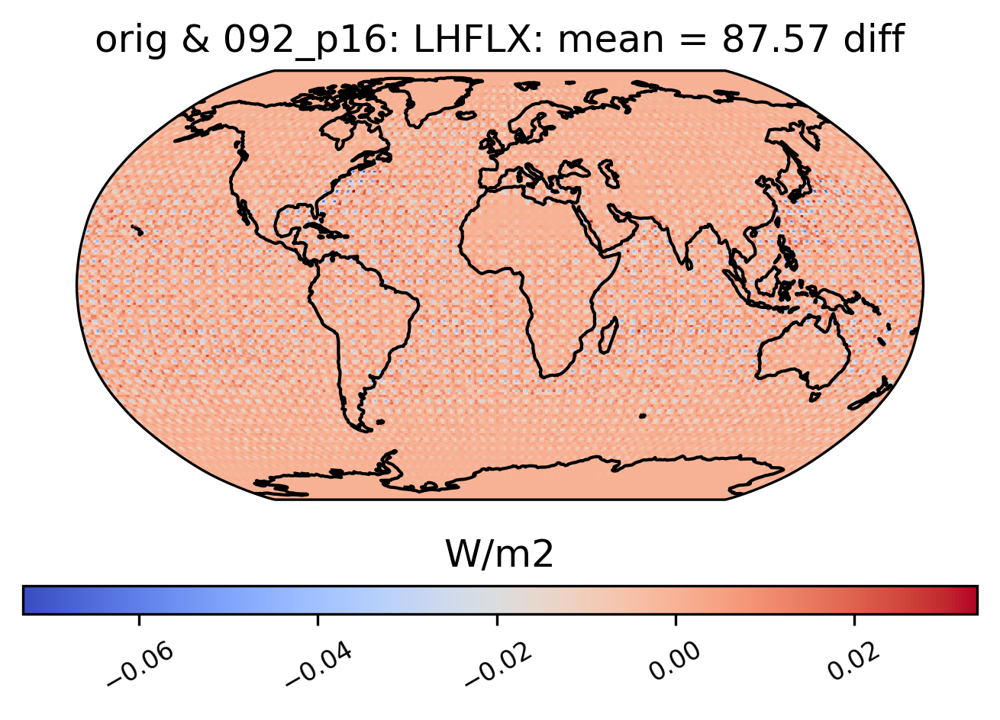

In [33]:
# just one so we can zoom in more
ldcpy.plot(col_lhflx, "LHFLX", sets=["orig", "092_p16"], calc="mean", calc_type="diff", lev=0)

In [25]:
# Disconnect when finished
cluster.close()
client.close()